<a href="https://colab.research.google.com/github/hanmrf/MachineLearning/blob/main/Tomato.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Import Library

In [1]:
# Import the required library
import os
import random
import shutil
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau
from PIL import Image, ImageDraw, ImageOps
import seaborn as sns
from google.colab import files

2. Download Dataset

In [2]:
!chmod 600 /content/kaggle.json

In [3]:
! KAGGLE_CONFIG_DIR=/content/ kaggle datasets download muhammadraihanf12/agricurify-tomatov2

Dataset URL: https://www.kaggle.com/datasets/muhammadraihanf12/agricurify-tomatov2
License(s): unknown
 99% 222M/224M [00:12<00:00, 20.1MB/s]
100% 224M/224M [00:12<00:00, 19.3MB/s]


3. Dataset Extraction

In [4]:
import zipfile

# ZIP file location
zip_file_path = "/content/agricurify-tomatov2.zip"
extract_to_path = "/content/"

# Extracting ZIP file
if os.path.exists(zip_file_path):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to_path)
        print("The file has been successfully extracted to the directory:", extract_to_path)
else:
    print("ZIP file not found at location:", zip_file_path)

The file has been successfully extracted to the directory: /content/


4. Dataset Analysis

In [5]:
# Dataset directory list
dataset_dirs = [
    "/content/Not_Tomato",
    "/content/Tomato___Bacterial_spot",
    "/content/Tomato___Leaf_Mold",
    "/content/Tomato___Septoria_leaf_spot",
    "/content/Tomato___Spider_mites Two-spotted_spider_mite",
    "/content/Tomato___Tomato_Yellow_Leaf_Curl_Virus",
    "/content/Tomato___Tomato_mosaic_virus",
    "/content/Tomato___healthy"
]

# Target directory for the merged dataset
merged_dataset_dir = "/content/Merged_Tomato"

# Create the target directory if it does not exist
os.makedirs(merged_dataset_dir, exist_ok=True)

# Copy images from each dataset directory to the target directory, maintaining class structure
for dataset_dir in dataset_dirs:
    # Get the class name from the directory name
    class_name = os.path.basename(dataset_dir)

    # Create class sub-directory in the target directory if it does not exist
    target_class_dir = os.path.join(merged_dataset_dir, class_name)
    os.makedirs(target_class_dir, exist_ok=True)

    # Copy images from the dataset directory to the class sub-directory in the target directory
    for filename in os.listdir(dataset_dir):
        src_path = os.path.join(dataset_dir, filename)
        dst_path = os.path.join(target_class_dir, filename)
        shutil.copy(src_path, dst_path)

print("Dataset has been merged into:", merged_dataset_dir)


Dataset has been merged into: /content/Merged_Tomato


In [6]:
tomato_data = "/content/Merged_Tomato"
tomato_classes = os.listdir(tomato_data)

print("tomato_classes:")
for classes in tomato_classes:
    if os.path.isdir(os.path.join(tomato_data, classes)):
        print(classes)

tomato_classes:
Not_Tomato
Tomato___Tomato_mosaic_virus
Tomato___Leaf_Mold
Tomato___healthy
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Tomato___Bacterial_spot
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Septoria_leaf_spot



Class Name: Not_Tomato
Total Images: 1027
Resolution of First Image: (256, 384, 3)


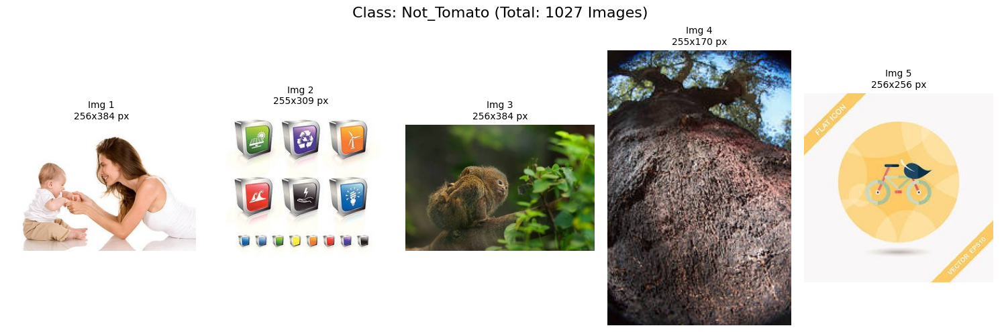


Class Name: Tomato___Tomato_mosaic_virus
Total Images: 1790
Resolution of First Image: (256, 256, 3)


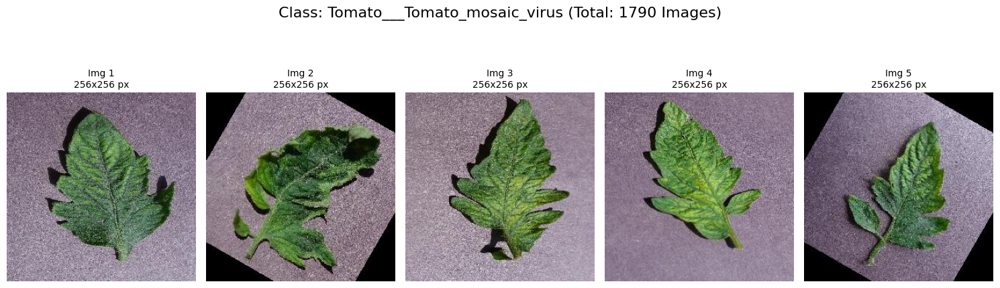


Class Name: Tomato___Leaf_Mold
Total Images: 1882
Resolution of First Image: (256, 256, 3)


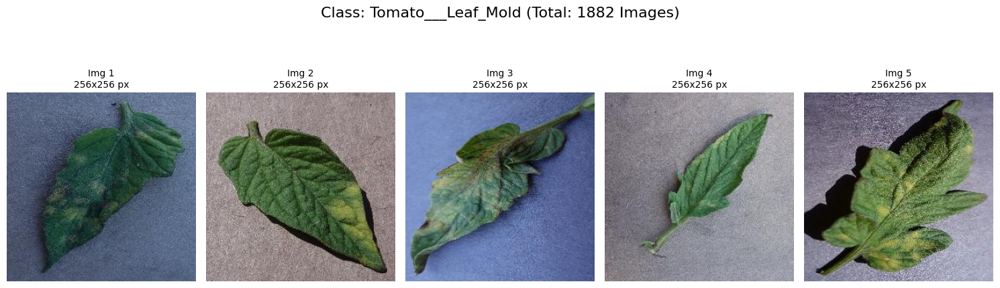


Class Name: Tomato___healthy
Total Images: 1926
Resolution of First Image: (256, 256, 3)


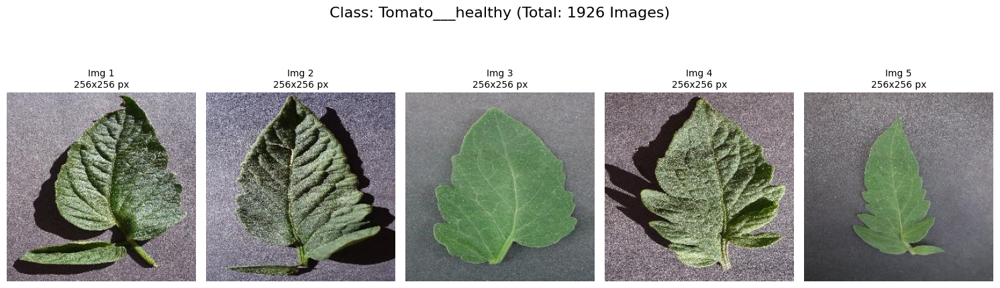


Class Name: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Total Images: 1961
Resolution of First Image: (256, 256, 3)


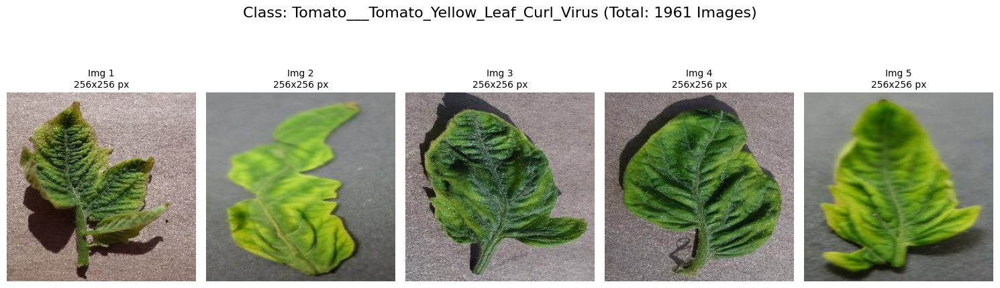


Class Name: Tomato___Bacterial_spot
Total Images: 1702
Resolution of First Image: (256, 256, 3)


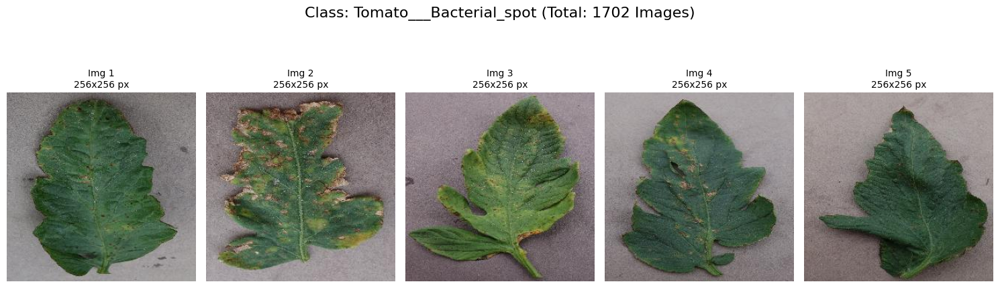


Class Name: Tomato___Spider_mites Two-spotted_spider_mite
Total Images: 1741
Resolution of First Image: (256, 256, 3)


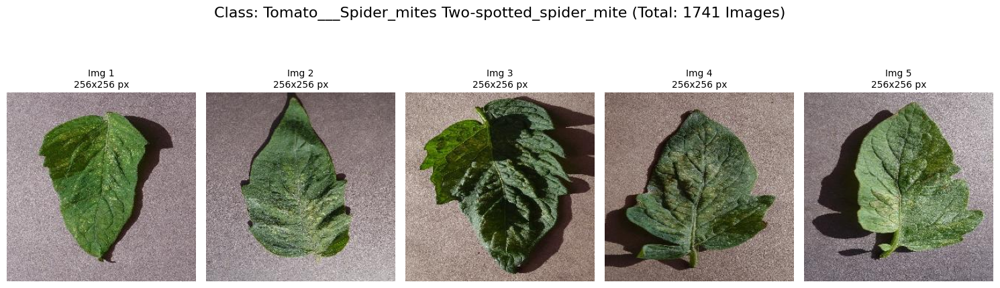


Class Name: Tomato___Septoria_leaf_spot
Total Images: 1745
Resolution of First Image: (256, 256, 3)


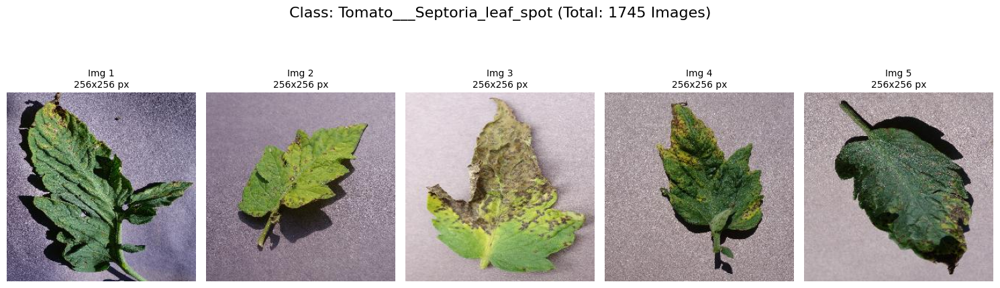

In [7]:
for item in tomato_classes:
    print("\nClass Name:", item)
    class_dir = os.path.join(tomato_data, item)
    class_images = os.listdir(class_dir)

    # Total images in each class
    num_images = len(class_images)
    print("Total Images:", num_images)

    # Resolution/size of the first image in the class
    img_path = os.path.join(class_dir, class_images[0])
    img = mpimg.imread(img_path)
    image_shape = img.shape
    print("Resolution of First Image:", image_shape)

    # Displaying some images with descriptive labels
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Class: {item} (Total: {num_images} Images)", fontsize=16)

    for i, img_file in enumerate(class_images[:5]):  # Display up to 5 images
        img_path = os.path.join(class_dir, img_file)
        img = mpimg.imread(img_path)

        # Add a subplot for each image
        sp = plt.subplot(1, 5, i + 1)
        plt.axis('off')
        plt.imshow(img)

        # Add descriptive title to each image
        plt.title(f"Img {i+1}\n{img.shape[0]}x{img.shape[1]} px", fontsize=10)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust to fit the suptitle
    plt.show()

5. Preprocessing Data

In [8]:
# New Directory for Balanced and Finalizing Dataset
Final_data_dir = "/content/Final_data"

# Number of Images to Be Selected from Each Class
num_images_per_class = min(
    len(os.listdir(os.path.join(tomato_data, "Tomato___Bacterial_spot"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Spider_mites Two-spotted_spider_mite"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Leaf_Mold"))),
    len(os.listdir(os.path.join(tomato_data, "Not_Tomato"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Septoria_leaf_spot"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Tomato_mosaic_virus"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___healthy"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Tomato_Yellow_Leaf_Curl_Virus")))
)

# Create New Directory in Final_data_dir
for class_name in tomato_classes:
    os.makedirs(os.path.join(Final_data_dir, class_name), exist_ok=True)

# Select Some Images from Each Class and Copy to Final_data_dir
for class_name in tomato_classes:
    source_dir = os.path.join(tomato_data, class_name)
    destination_dir = os.path.join(Final_data_dir, class_name)

    # Get a list of image files in the source directory
    image_files = os.listdir(source_dir)

    # Select a subset of images (up to num_images_per_class)
    selected_images = image_files[:num_images_per_class]

    # Copy the selected images to the destination directory
    for image_file in selected_images:
        shutil.copy(os.path.join(source_dir, image_file), destination_dir)

print(f"Final_data dataset created in: {Final_data_dir}")

Final_data dataset created in: /content/Final_data


Preview Final Dataset:

Class: Not_Tomato
Total Images: 1027


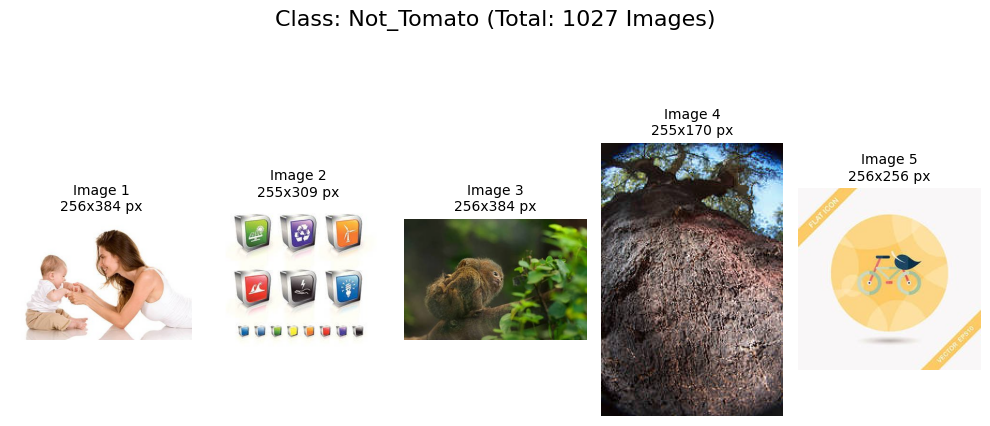


Class: Tomato___Tomato_mosaic_virus
Total Images: 1027


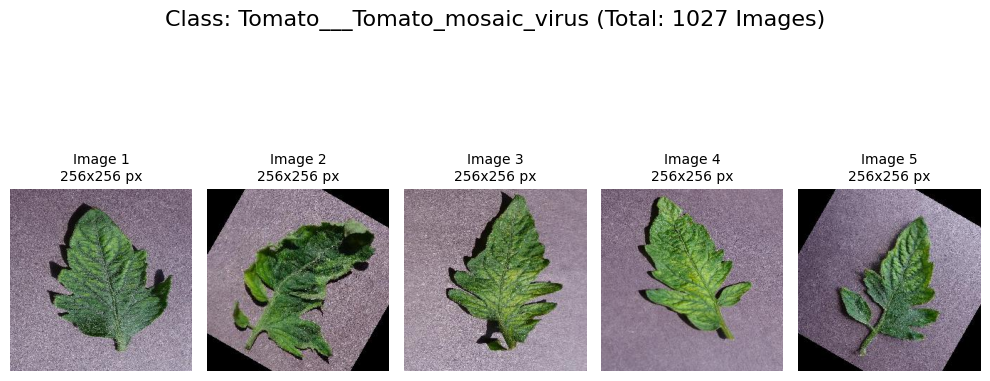


Class: Tomato___Leaf_Mold
Total Images: 1027


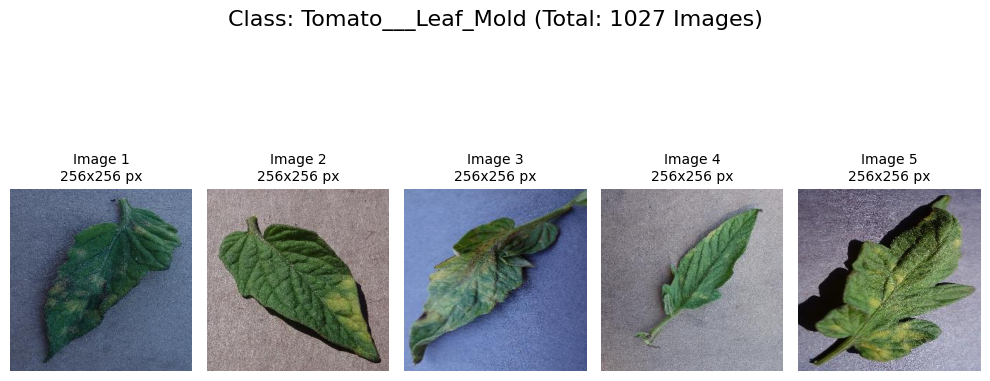


Class: Tomato___healthy
Total Images: 1027


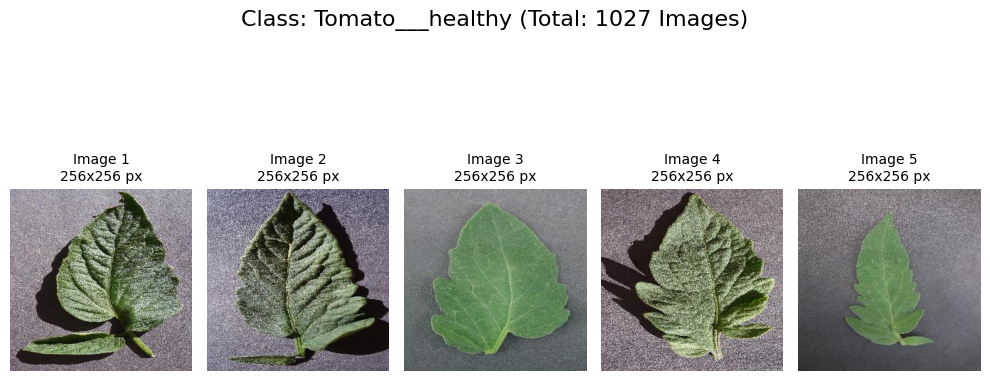


Class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Total Images: 1027


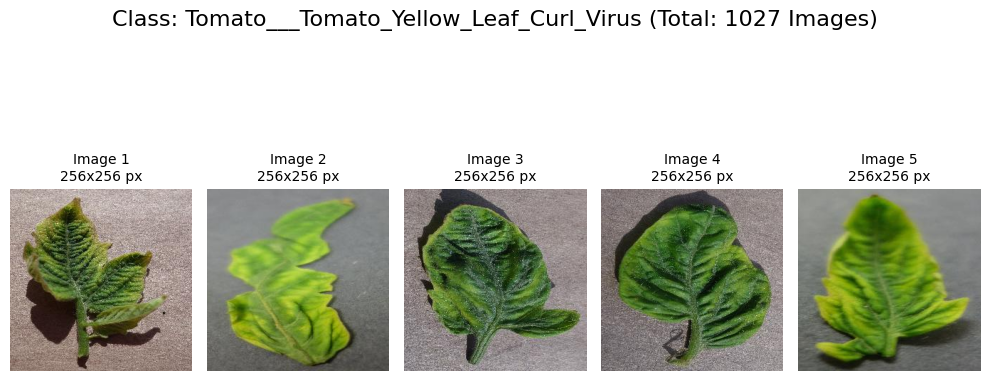


Class: Tomato___Bacterial_spot
Total Images: 1027


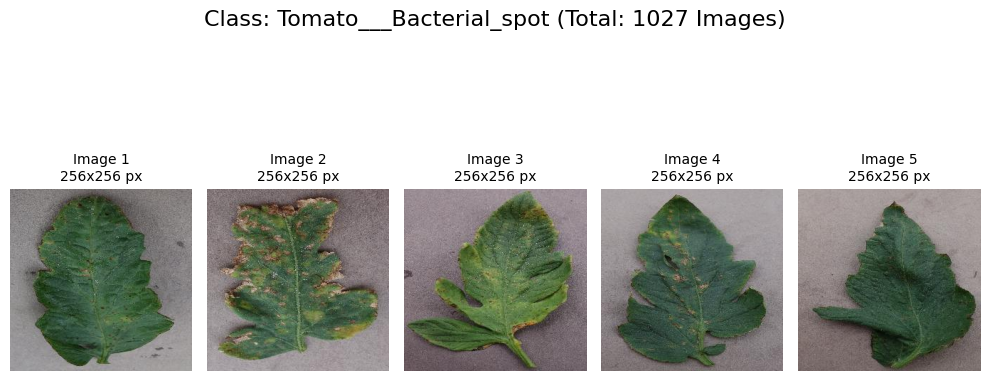


Class: Tomato___Spider_mites Two-spotted_spider_mite
Total Images: 1027


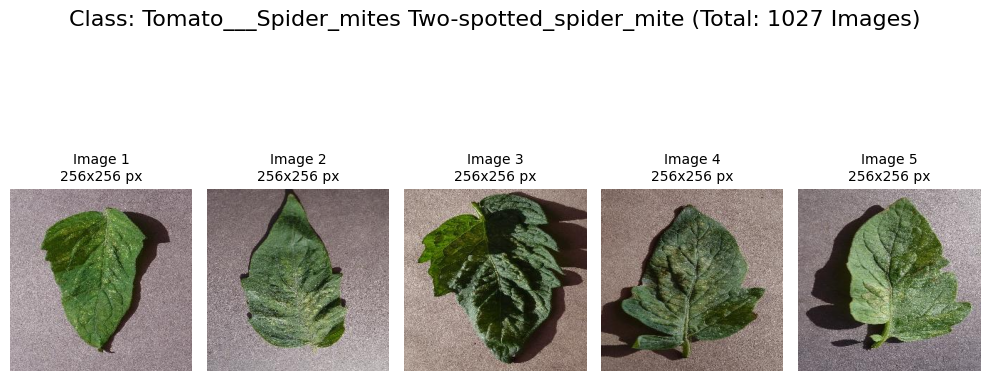


Class: Tomato___Septoria_leaf_spot
Total Images: 1027


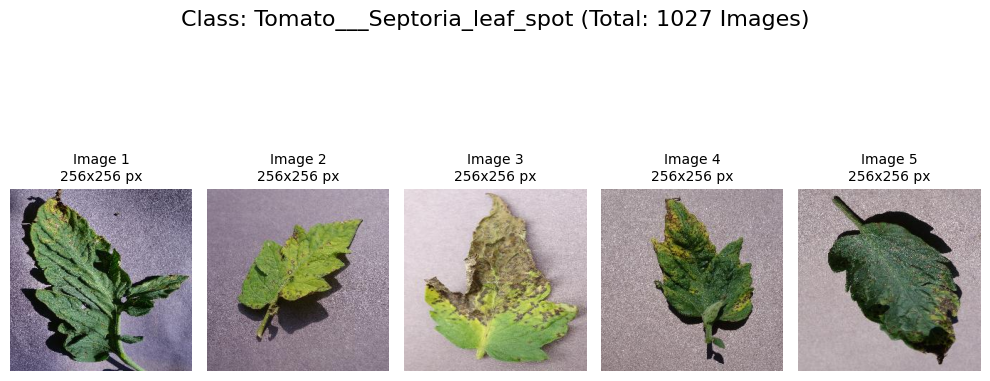

In [9]:
# Preview images from the final dataset
print("Preview Final Dataset:")

for class_name in tomato_classes:
    print(f"\nClass: {class_name}")

    # Class directory
    class_dir = os.path.join(Final_data_dir, class_name)

    # List of images in the class
    class_images = os.listdir(class_dir)

    # Total images in the class
    num_images = len(class_images)
    print(f"Total Images: {num_images}")

    # Display a few images from the class
    plt.figure(figsize=(10, 5))
    plt.suptitle(f"Class: {class_name} (Total: {num_images} Images)", fontsize=16)

    for i, image_file in enumerate(class_images[:5]):  # Display up to 5 images
        image_path = os.path.join(class_dir, image_file)
        image = mpimg.imread(image_path)

        # Add a subplot for each image
        plt.subplot(1, 5, i + 1)
        plt.axis('off')
        plt.imshow(image)

        # Add a descriptive title to each image
        plt.title(f"Image {i + 1}\n{image.shape[0]}x{image.shape[1]} px", fontsize=10)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust for the main title
    plt.show()

6. Split Model

In [10]:
# Dataset directory and class names
dataset_dir = "/content/Final_data"
classes = [
    "Tomato___Bacterial_spot",
    "Tomato___Spider_mites Two-spotted_spider_mite",
    "Tomato___Leaf_Mold",
    "Not_Tomato",
    "Tomato___Septoria_leaf_spot",
    "Tomato___Tomato_mosaic_virus",
    "Tomato___healthy",
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus"
]

# Ratios for splitting data
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Process each class
for class_name in classes:
    # Define class directory and fetch files
    class_dir = os.path.join(dataset_dir, class_name)
    files = os.listdir(class_dir)
    random.shuffle(files)

    # Calculate split sizes
    num_files = len(files)

    # Ensure there are enough files for each split
    if num_files < 3:
        print(f"Not enough files in {class_name} to split into train, val, and test sets.")
        continue

    num_train = max(1, int(num_files * train_ratio))
    num_val = max(1, int(num_files * val_ratio))
    num_test = num_files - num_train - num_val

    # Adjust if necessary to ensure all splits are non-empty
    if num_test < 1:
        num_test = 1
        num_val = num_files - num_train - num_test

    if num_val < 1:
        num_val = 1
        num_test = num_files - num_train - num_val

    # Split files into train, validation, and test sets
    train_files = files[:num_train]
    val_files = files[num_train:num_train + num_val]
    test_files = files[num_train + num_val:]

    # Move files to respective folders
    for folder_name, file_list in [("train", train_files), ("val", val_files), ("test", test_files)]:
        folder_path = os.path.join(dataset_dir, folder_name, class_name)
        os.makedirs(folder_path, exist_ok=True)

        for file in file_list:
            src = os.path.join(class_dir, file)
            dst = os.path.join(folder_path, file)
            shutil.move(src, dst)

In [11]:
# Directory paths
train_dir = '/content/Final_data/train'
val_dir = '/content/Final_data/val'
test_dir = '/content/Final_data/test'

# Image size compatible with MobileNetV2 input
img_size = 224
batch_size = 32

# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255)

# Data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Class weights to handle imbalance
y_train = train_generator.classes
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = {i: weight for i, weight in enumerate(class_weights)}

Found 6568 images belonging to 8 classes.
Found 816 images belonging to 8 classes.
Found 832 images belonging to 8 classes.


7. Creating a Model

In [12]:
# Initialize pre-trained MobileNetV2
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3))
base_model.trainable = False  # Freeze all layers

# Creating a new model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu', kernel_regularizer=l2(0.01)),
    layers.Dropout(0.4),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(8, activation='softmax')  # 8 class
])

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │           2,056 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,047,240 (11.62 MB)

 Trainable params: 789,256 (3.01 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [13]:
# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

# Training model
history = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[lr_scheduler],
    verbose=1
)

# Model evaluation on validation data
val_loss, val_acc = model.evaluate(val_generator)
print(f'Validation accuracy: {val_acc * 100:.2f}%')

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


206/206 ━━━━━━━━━━━━━━━━━━━━ 129s 542ms/step - accuracy: 0.5764 - loss: 5.4256 - val_accuracy: 0.8272 - val_loss: 1.4744 - learning_rate: 0.0010
Epoch 2/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 119s 476ms/step - accuracy: 0.8156 - loss: 1.3448 - val_accuracy: 0.8995 - val_loss: 0.7873 - learning_rate: 0.0010
Epoch 3/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 100s 474ms/step - accuracy: 0.8349 - loss: 0.9372 - val_accuracy: 0.7953 - val_loss: 0.9382 - learning_rate: 0.0010
Epoch 4/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 99s 468ms/step - accuracy: 0.8295 - loss: 0.8459 - val_accuracy: 0.8836 - val_loss: 0.6438 - learning_rate: 0.0010
Epoch 5/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 100s 468ms/step - accuracy: 0.8335 - loss: 0.7655 - val_accuracy: 0.8934 - val_loss: 0.6097 - learning_rate: 0.0010
Epoch 6/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 99s 468ms/step - accuracy: 0.8469 - loss: 0.7319 - val_accuracy: 0.9105 - val_loss: 0.5617 - learning_rate: 0.0010
Epoch 7/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 99s 466ms/step - accuracy: 0.8473 - l

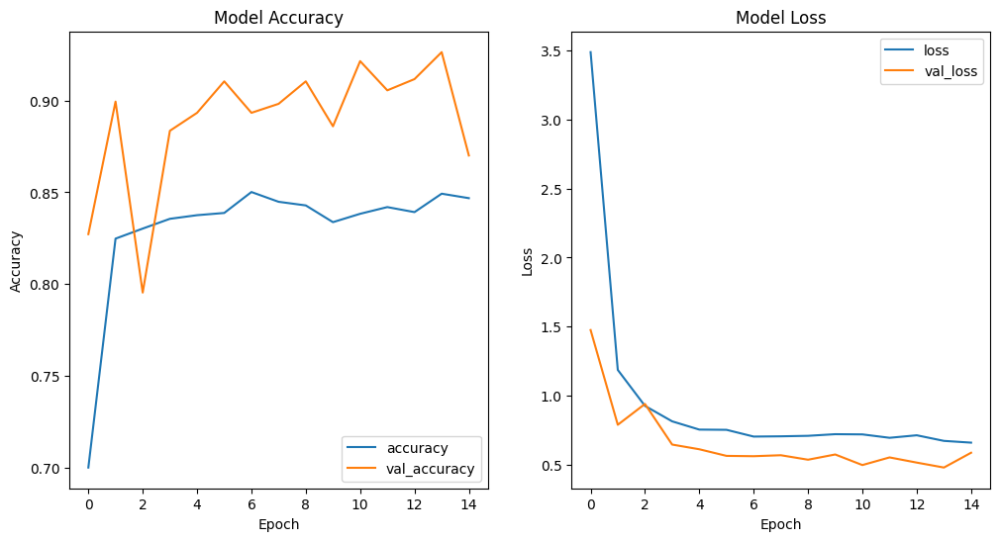

In [14]:
# Plotting accuracy and loss
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()

Found 832 images belonging to 8 classes.
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step


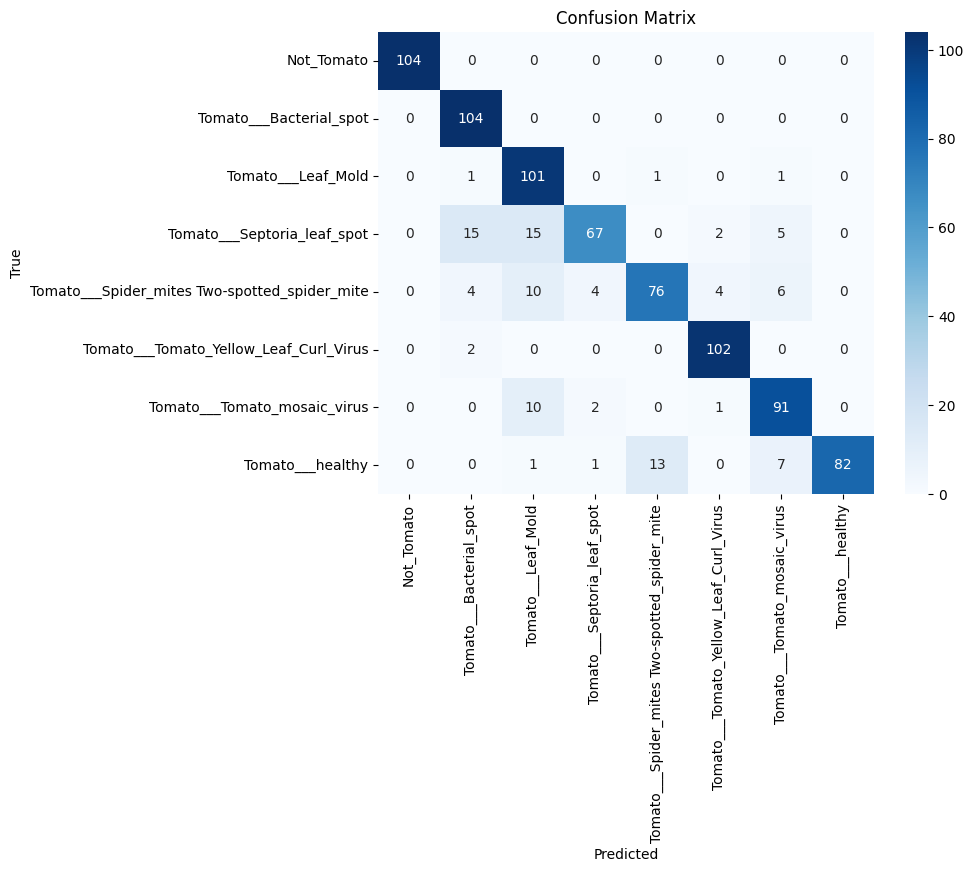

In [15]:
# Confusion Matrix (for testing data)
test_generator = val_test_datagen.flow_from_directory(test_dir, target_size=(img_size, img_size), batch_size=batch_size, class_mode='categorical', shuffle=False)

# Prediction with trained model
test_preds = model.predict(test_generator, verbose=1)
test_preds = np.argmax(test_preds, axis=1)

# Confusion matrix
cm = confusion_matrix(test_generator.classes, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

8. Fine Tuning

In [16]:
# Unfreeze some of the last layers of the base model
base_model.trainable = True
for layer in base_model.layers[-30:]:  # Change the number -30 to set the number of layers to unfreeze
    layer.trainable = False

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Fine-tuning training
history_fine_tune = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[lr_scheduler],
    verbose=1
)

Epoch 1/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 169s 602ms/step - accuracy: 0.7832 - loss: 1.0756 - val_accuracy: 0.7610 - val_loss: 0.9016 - learning_rate: 1.0000e-04
Epoch 2/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 158s 495ms/step - accuracy: 0.9246 - loss: 0.4165 - val_accuracy: 0.8407 - val_loss: 0.6378 - learning_rate: 1.0000e-04
Epoch 3/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 103s 478ms/step - accuracy: 0.9526 - loss: 0.3430 - val_accuracy: 0.8382 - val_loss: 0.6933 - learning_rate: 1.0000e-04
Epoch 4/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 142s 478ms/step - accuracy: 0.9596 - loss: 0.3070 - val_accuracy: 0.9265 - val_loss: 0.4071 - learning_rate: 1.0000e-04
Epoch 5/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 144s 491ms/step - accuracy: 0.9645 - loss: 0.2803 - val_accuracy: 0.9498 - val_loss: 0.3236 - learning_rate: 1.0000e-04
Epoch 6/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 141s 488ms/step - accuracy: 0.9652 - loss: 0.2590 - val_accuracy: 0.9412 - val_loss: 0.3223 - learning_rate: 1.0000e-04
Epoch 7/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 

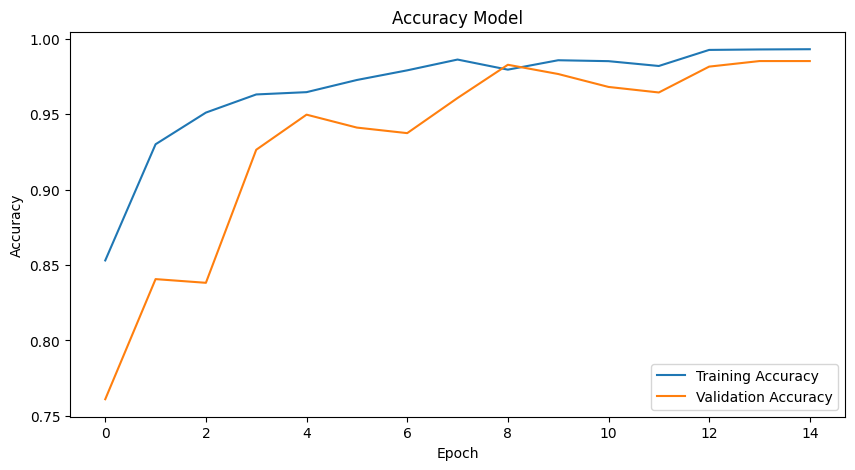

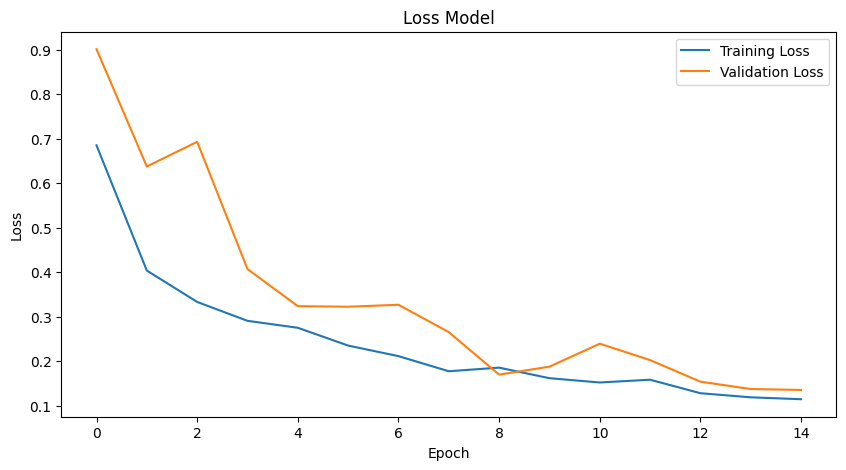

In [17]:
# Plot Accuracy after fine tuning
plt.figure(figsize=(10, 5))
plt.plot(history_fine_tune.history['accuracy'], label='Training Accuracy')
plt.plot(history_fine_tune.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Model')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

# Plot Loss
plt.figure(figsize=(10, 5))
plt.plot(history_fine_tune.history['loss'], label='Training Loss')
plt.plot(history_fine_tune.history['val_loss'], label='Validation Loss')
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step


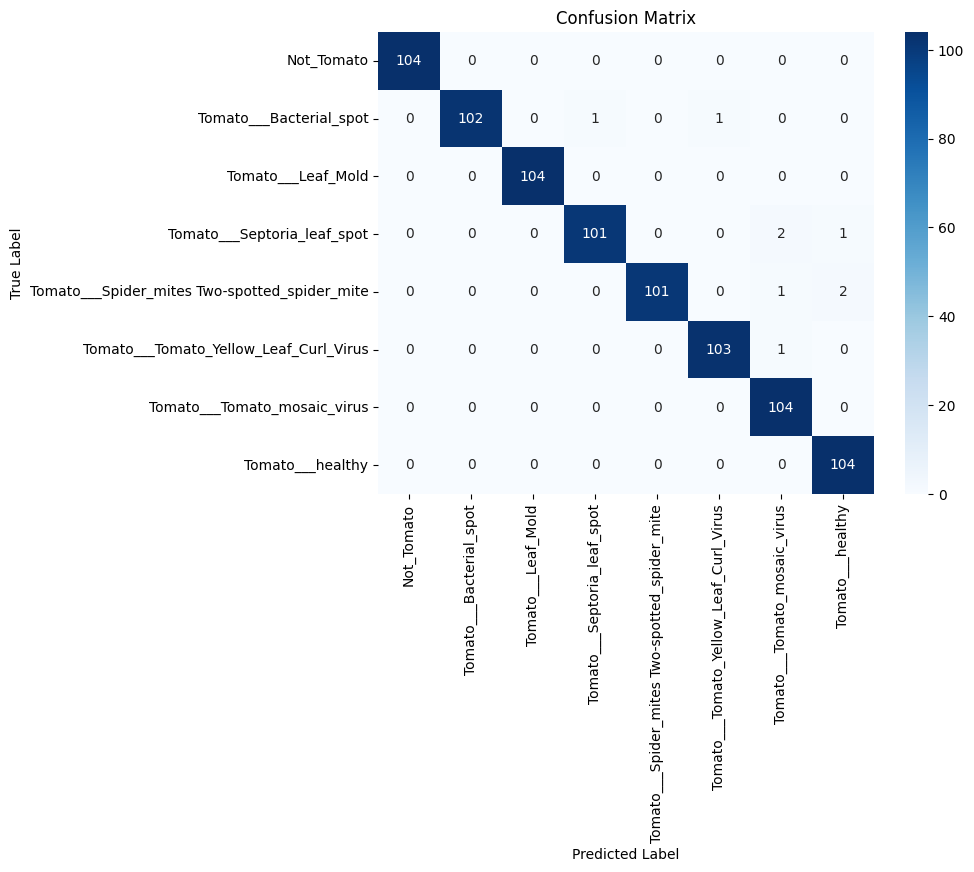

In [18]:
# Prediction on test data
test_predictions = model.predict(test_generator, verbose=1)
test_predictions = np.argmax(test_predictions, axis=1)  # Get predicted class labels

# Get true labels from the test generator
true_labels = test_generator.classes

# Create a confusion matrix after fine-tuning
cm = confusion_matrix(true_labels, test_predictions)

# Visualization of the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

9. Test Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


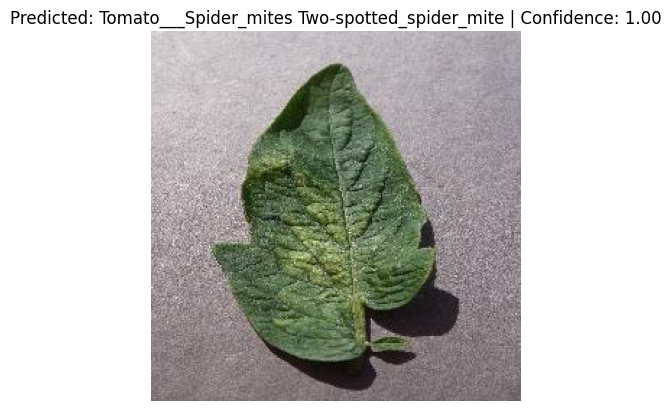

In [19]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___Spider_mites Two-spotted_spider_mite/003b7929-a364-4e74-be1c-37c4c0a6ec63___Com.G_SpM_FL 1414.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


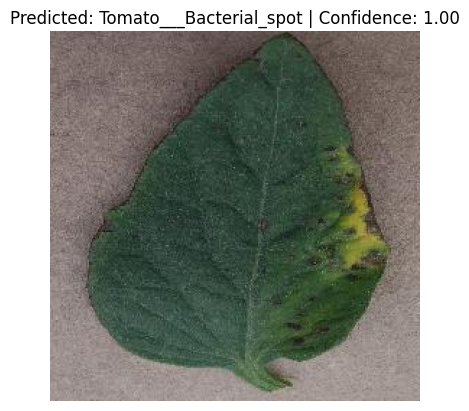

In [20]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___Bacterial_spot/01375198-62af-4c40-bddf-f3c11107200b___GCREC_Bact.Sp 5914.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


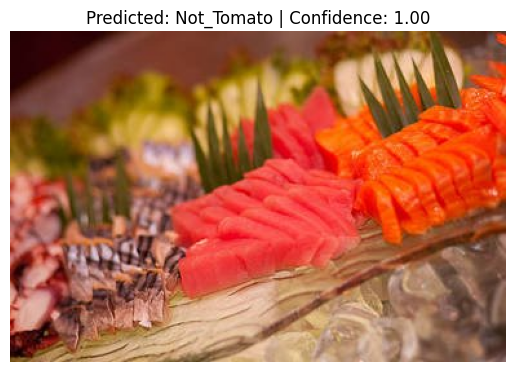

In [21]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Not_Tomato/102.jpg'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


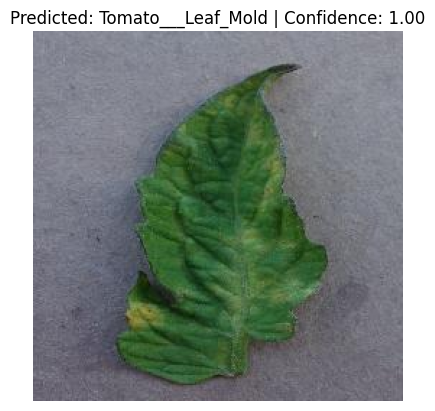

In [22]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___Leaf_Mold/022a4dfb-84cc-45cb-81c5-a620817e31cb___Crnl_L.Mold 6926.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


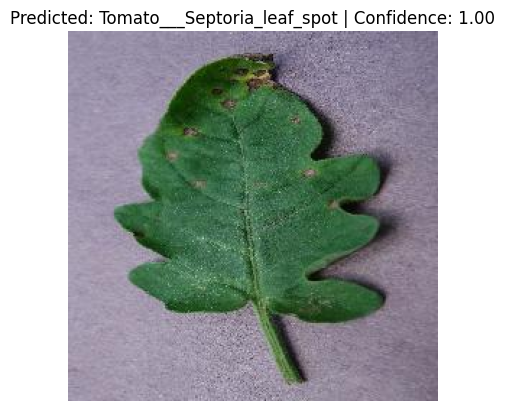

In [23]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___Septoria_leaf_spot/009bb542-f0c0-40f2-98a7-f547c5adec45___Matt.S_CG 1355.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


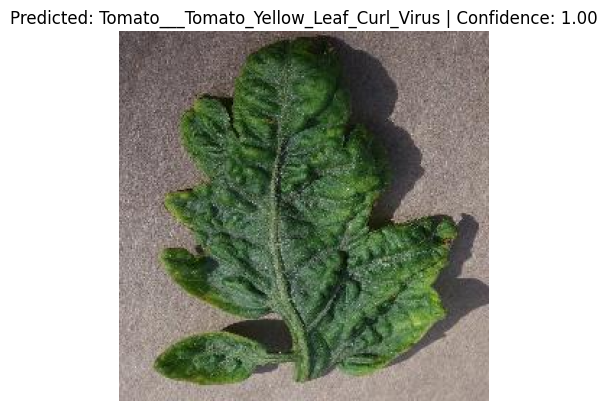

In [24]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___Tomato_Yellow_Leaf_Curl_Virus/0402077e-1231-48b4-8aa6-3a9c492dc7e6___YLCV_GCREC 2163.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


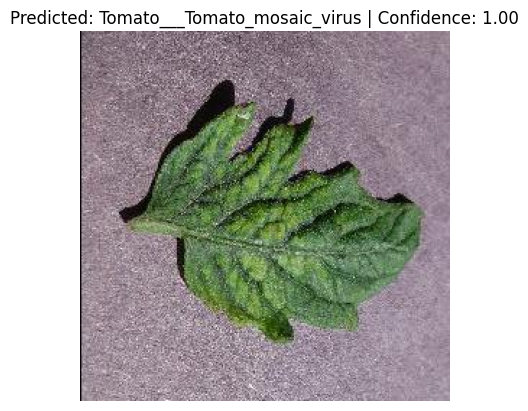

In [25]:
# Test Image Dataset
# Function to predict an image
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model's confidence in the prediction
    return pred_class, confidence

# Function to display the image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___Tomato_mosaic_virus/0befa341-0db3-49f4-b4fc-beeb05854bff___PSU_CG 2338_270deg.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


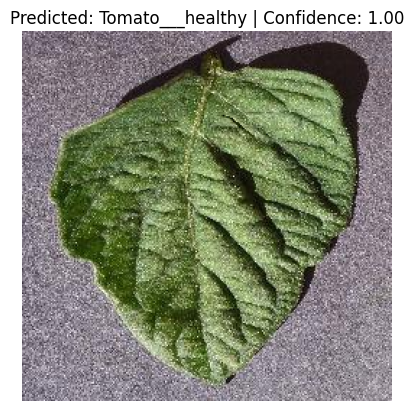

In [26]:
# Image Dataset Test
# Function for image prediction
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model confidence in the prediction
    return pred_class, confidence

# Function to display image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/Tomato___healthy/00bce074-967b-4d50-967a-31fdaa35e688___RS_HL 0223_180deg.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


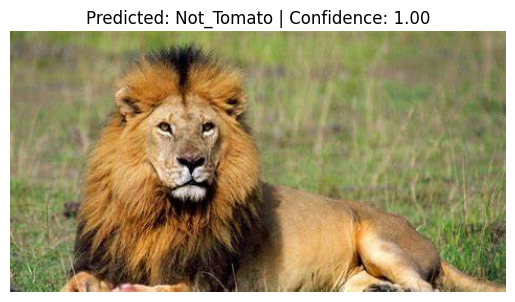

In [27]:
# Test with a New Image
# Function for image prediction
def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model confidence in the prediction
    return pred_class, confidence

# Function to display image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/lion.jpg'  # Path to the image
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


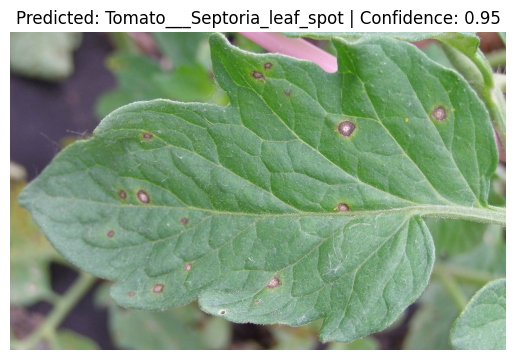

In [28]:
# Test with a New Image
# Function for image prediction
def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add dimension for batch size
    img_array /= 255.0  # Normalize
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Predicted class
    confidence = prediction[0][pred_class]  # Model confidence in the prediction
    return pred_class, confidence

# Function to display image and prediction result
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Try predicting a specific image
img_path = '/content/tomato-septoria-leaf-spot-grabowski.jpg'  # Path to the image
pred_class, confidence = predict_image(img_path, model, img_size)

# List of class names in the model
class_names = list(test_generator.class_indices.keys())

# Display the image and prediction result
display_image_and_prediction(img_path, pred_class, confidence, class_names)

In [29]:
# Save the fine-tuned model
model.save('Final Tomato MobileNetV2 model2.h5')